# Clase 03: Visualización RGB y operaciones Elementales sobre Rasters


Lo que veremos en esta notebook:

- [x]  Aprender (o mejor dicho, repasar) las operaciones básicas de lectura y visualización de archivos raster georreferenciados, extendiéndolo al caso de un raster multibanda y a la visualización RGB.  
- [x]  Aprender a realizar operaciones básicas de procesamiento como el apilado y el álgebra de bandas. 
- [x]  Guardar recortes de una imagen original como archivos nuevos en nuestro equipo.

**Datos con los que vamos a trabajar en esta Notebook**:

- Archivo Geotiff _SPOT_20170806_MS_p.tif_, disponible para descargar en este [enlace](https://drive.google.com/file/d/1hw4DPCMW5InB_ZTRFQn174m5ESkJ-CzT/view?usp=sharing).

Ponelos a todos en tu carpeta `data` para que funcionen los  _path_ empleados en esta Notebook.

## 1. Lectura de imágenes de múltiples bandas

Vamos a trabajar con la misma escena SPOT 7 de la ciudad de Córdoba presentada en la clase anterior, pero ahora utilizaremos el archivo multiespectral. Utilizaremos la librería `Rasterio` introducida en la clase anterior para abrir el archivo, y para luego escribir los resultados obtenidos. Para el tratamiento de los datos utilizaremos la estructura que nos ofrecen los arreglos de `Numpy` que ya venimos utilizando:  


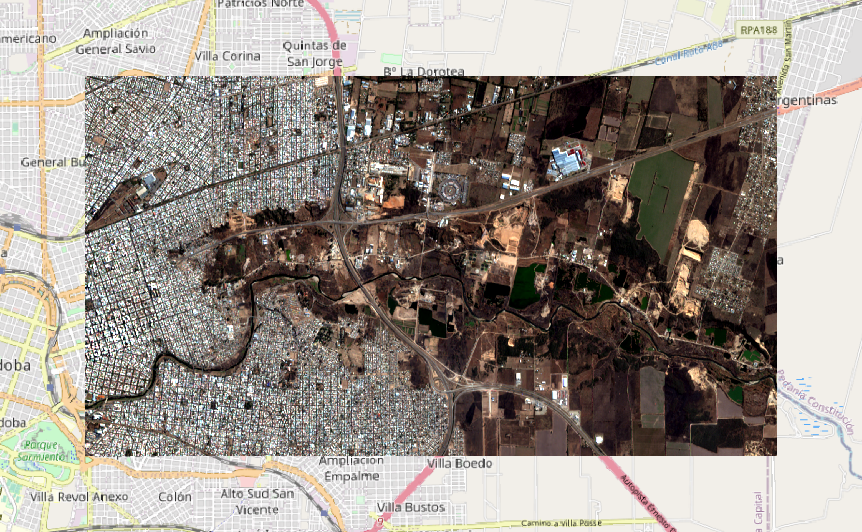

Empecemos por importar las librerías que vamos a utilizar:

```python
import numpy as np
import rasterio
from matplotlib import pyplot as plt
import funciones as fn
```

In [1]:
import numpy as np
import rasterio
from matplotlib import pyplot as plt
import funciones as fn

A continuación, miremos nuestros archivos en la carpeta **data**. Tenemos dos archivos de extensión **.tif**. Uno corresponde a la banda pancromática de nuestra SPOT, y el otro a un apilado de las 3 bandas del visible + el infrarrojo cercano (NIR) (¿qué resolucion tienen cada uno de estos productos?):  

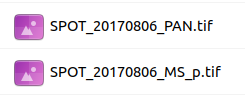   
  

Vamos a leer el archivo **SPOT_20170806_MS_p.tif**.

En este archivo están apiladas las bandas en el siguiente orden:

- Banda 1: Azul
- Banda 2: Verde
- Banda 3: Rojo
- Banda 4: Infrarrojo cercano

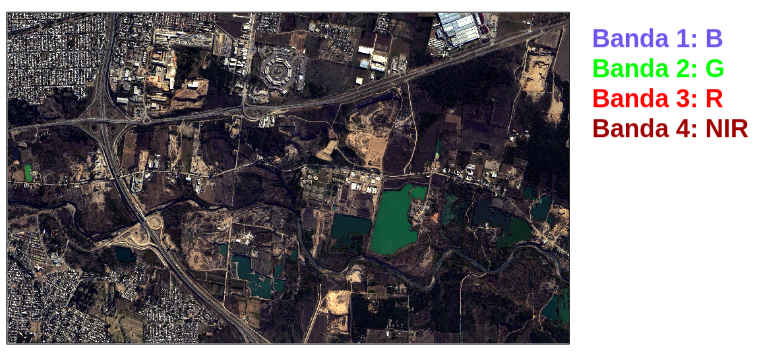


```python
spot_multibanda = rasterio.open('data/SPOT_20170806_MS_p.tif')
```

In [2]:
#spot_multibanda = rasterio.open('data/SPOT_20170806_MS_p.tif')
spot_multibanda = rasterio.open('https://github.com/francobarrionuevoenv21/MAIE_devs_pub/raw/refs/heads/main/Proc_Img/practicos/data/SPOT_20170806_MS_p.tif')

Convertiremos este objeto de Rasterio a matriz de Numpy con el método `read`aprendido en la Clase 2, pero antes leeremos algunos de sus parámetros, concretamente su _Transform_, ya que volveremos sobre eso al final de esta Clase.

```python
transform_spot_original = spot_multibanda.transform
print(transform_spot_original)
#Recordar: ¿Qué devuelve el print() sobre estas variables?
```

In [3]:
transform_spot_original = spot_multibanda.transform
print(transform_spot_original)

| 6.00, 0.00, 388866.00|
| 0.00,-6.00, 6528056.00|
| 0.00, 0.00, 1.00|


Ahora sí, leemos la imagen como matriz. Vamos a utilizar la función `subset_img()` creada en la clase anterior, e importada desde el archivo de funciones, para extraer un recorte rectangular definido a partir de coordenadas de esquinas. A la variable `ventana_recorte` la vamos a utilizar cuando debamos guardar este recorte como imagen nueva.

```python

ulx, uly = 393360.0, 6526862.0
lrx, lry = 397860.0, 6523262.0


spot_apilada, ventana_recorte = fn.subset_img(spot_multibanda, ulx, uly, lrx, lry)
```

In [7]:
spot_multibanda.read().shape

(4, 989, 1801)

In [3]:
ulx, uly = 393360.0, 6526862.0
lrx, lry = 397860.0, 6523262.0


spot_apilada, ventana_recorte = fn.subset_img(spot_multibanda, ulx, uly, lrx, lry, [1, 2, 3, 4])

#### Veamos las dimensiones de esta imagen, ¿Cuántas bandas, filas y columnas hemos leído?

```python
spot_apilada.shape
```

In [6]:
spot_apilada.shape

(4, 600, 750)

Hagamos uso de nuestra función `scale` ya definida en nuestro archivo de funciones para ver cada una de las bandas de esta imagen y sus respectivos histogramas:

```python
import matplotlib.pyplot as plt

fig, ax = plt.subplots(
    nrows=4,
    ncols=2,
    figsize=(12, 18),
    gridspec_kw={"width_ratios": [1, 1.2]}
)

for i in range(4):

    banda = spot_apilada[i]

    # Imagen (se aplica la función scale para mejorar el contraste)
    ax[i, 0].imshow(fn.scale(banda, p=1), cmap="gray")
    ax[i, 0].set_title(f"Banda {i+1}")
    ax[i, 0].axis("off")

    # Histograma
    ax[i, 1].hist(banda.ravel(), bins=256)
    ax[i, 1].set_title(f"Histograma - Banda {i+1}")
    ax[i, 1].set_xlabel("Valor de píxel")
    ax[i, 1].set_ylabel("Frecuencia")

plt.tight_layout()
plt.show()
```

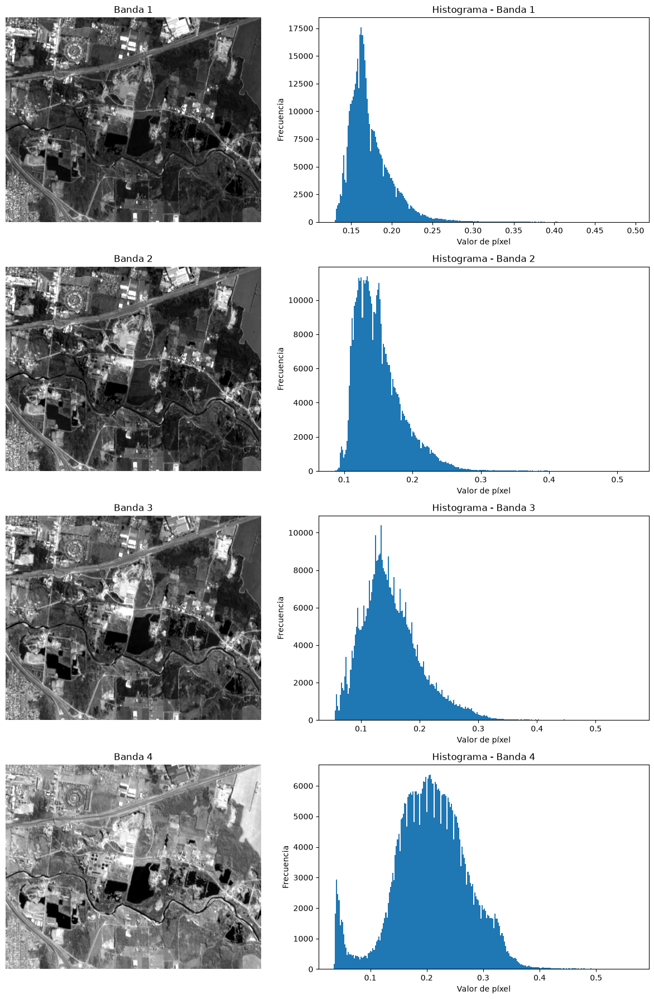

In [7]:
fig, ax = plt.subplots(
    nrows=4,
    ncols=2,
    figsize=(12, 18),
    gridspec_kw={"width_ratios": [1, 1.2]}
)

for i in range(4):

    banda = spot_apilada[i]

    # Imagen (se aplica la función scale para mejorar el contraste)
    ax[i, 0].imshow(fn.scale(banda, p=1), cmap="gray")
    ax[i, 0].set_title(f"Banda {i+1}")
    ax[i, 0].axis("off")

    # Histograma
    ax[i, 1].hist(banda.ravel(), bins=256)
    ax[i, 1].set_title(f"Histograma - Banda {i+1}")
    ax[i, 1].set_xlabel("Valor de píxel")
    ax[i, 1].set_ylabel("Frecuencia")

plt.tight_layout()
plt.show()

## 1.2.Visualización de imágenes en RGB

A diferencia de la Clase 02, aquí estamos trabajando con la imagen SPOT de 4 bandas. Esto nos permite generar composiciones RGB para hacer visualizaciones en color. No obstante, `Matplotlib` impone algunas condiciones para trabajar con este tipo de arreglos:

**[1]** En primer lugar, cuando se trabaja con matrices de tres dimensiones `imwhow` espera la estructura `(fila,columna,banda)`. Por lo tanto, tenemos que _reordenar_ nuestra matriz que viene con estructura `(banda, fila, columna)`. 

**[2]** En segundo lugar, espera que se le pase un arreglo de exactamente 3 canales o bandas, salvo ciertas excepciones. Entonces, vamos a usar las herramientas de _slicing_ de `Numpy` para generar nuestras combinaciones RGB con distintos canales.

**[3]** En tercer lugar, también espera que los datos estén escalados de 0 a 255 si son enteros, o de 0 a 1 si son flotantes. Esto implica que, necesariamente, debamos escalar todas las bandas al mismo rango. Aquí cobra sentido haber escrito la función `scale()` para asegurarnos esa normalización.

**[4]** Por último, no se puede establecer un `vmin,vmax` para cada canal por separado con el objetivo de mejorar el contraste de la imagen. Aquí también cobra relevancia nuestra función `scale`, ya que la emplearemos para mejorar el contraste de nuestras bandas de entrada de manera más ordenada y sistemática.


Para generar el RGB, podemos aplicar un _slicing_  (punto **[2]**) sobre la dimensión de las bandas, que es la dimensión 0 en nuestro _array_. Por ejemplo, si queremos armar una combinación RGB usando los canales `[2,1,0]`, podemos hacer `spot_apilada[[2,1,0]]`. Luego, para pasarle esto a `Matplotlib`, tenemos que hacer un cambio de ejes para que nos quede la estructura `(filas,columnas,bandas)`. Esto lo podemos hacer con la función `.transpose()`. En cuanto al item **[3]**, estas imágenes se encuentran en el rango [0-1], con lo cual no tenemos problema inicialmente. Sí tendremos que trabajar luego sobre **[4]** para mejorar el contraste de la imagen.

```python
# Formar un RGB usando los canales 2, 1 y 0
rgb = spot_apilada[[2, 1, 0]]
print(f"Dimensiones del RGB: {rgb.shape}")

# Transponer los ejes (bandas, filas, columnas) -> (filas, columnas, bandas)
rgb = rgb.transpose(1, 2, 0)
print(f"Dimensiones del RGB traspuesto: {rgb.shape}")

fig, ax = plt.subplots(figsize=(12, 8))

ax.set_title("Combinación RGB 2-1-0", fontsize=16)
ax.imshow(rgb)
ax.axis("off")
plt.show()
```

Dimensiones del RGB: (3, 600, 750)
Dimensiones del RGB traspuesto: (600, 750, 3)


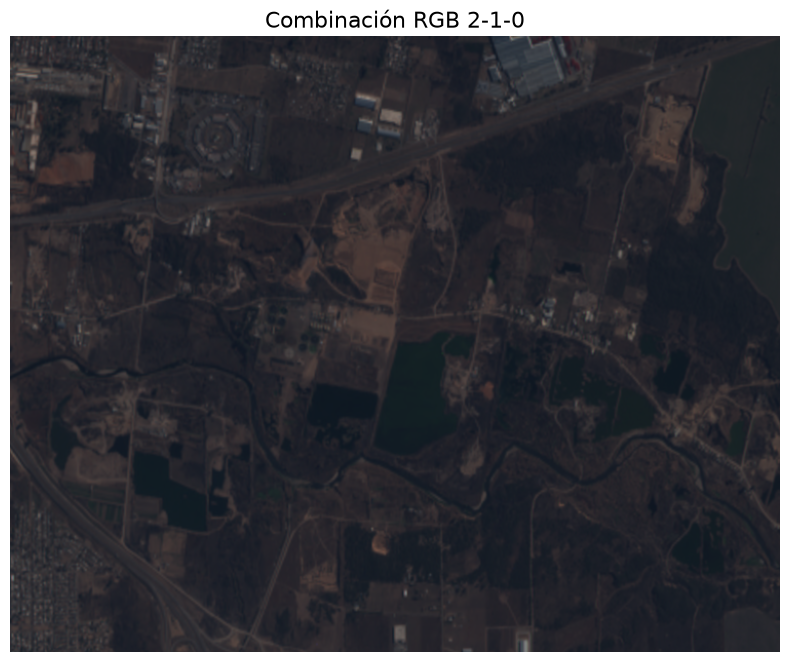

In [8]:
# Formar un RGB usando los canales 2, 1 y 0
rgb = spot_apilada[[2, 1, 0]]
print(f"Dimensiones del RGB: {rgb.shape}")

# Transponer los ejes (bandas, filas, columnas) -> (filas, columnas, bandas)
rgb = rgb.transpose(1, 2, 0) # Banda 1 a eje 2, banda 2 a eje 1, y banda 3 a eje 2
print(f"Dimensiones del RGB traspuesto: {rgb.shape}")

fig, ax = plt.subplots(figsize=(12, 8))

ax.set_title("Combinación RGB 2-1-0", fontsize=16)
ax.imshow(rgb)
ax.axis("off")
plt.show()

La imagen se ve algo saturada, y con poco contraste. Probamos qué pasa escalando con `p = 2`, usando la función `scale` sobre cada una de las bandas:

```python
#Armamos los array con los que queremos trabajar
r = spot_apilada[2,:,:]
g = spot_apilada[1,:,:]
b = spot_apilada[0,:,:]

#Hacemos el escalado por mínimo y máximo de cada una:
r1 = fn.scale(r, p = 2)
g1 = fn.scale(g, p = 2)
b1 = fn.scale(b, p = 2)

#Las juntamos de nuevo en un solo array
rgb = np.array((r1,g1,b1))
rgb = rgb.transpose(1,2,0)

fig, ax = plt.subplots(figsize=(12, 8))
ax.set_title(f'Combinación 2, 1, 0', size = 20)
ax.imshow(rgb)
plt.show()
```

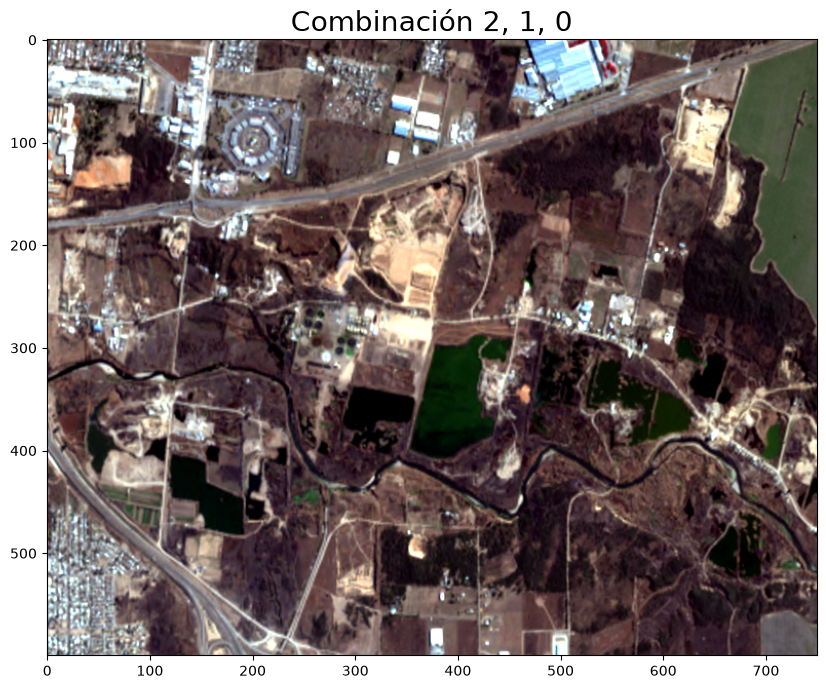

In [9]:
#Armamos los array con los que queremos trabajar
r = spot_apilada[2,:,:]
g = spot_apilada[1,:,:]
b = spot_apilada[0,:,:]

#Hacemos el escalado por mínimo y máximo de cada una:
r1 = fn.scale(r, p = 2)
g1 = fn.scale(g, p = 2)
b1 = fn.scale(b, p = 2)

#Las juntamos de nuevo en un solo array
rgb = np.array((r1,g1,b1))
rgb = rgb.transpose(1,2,0)

fig, ax = plt.subplots(figsize=(12, 8))
ax.set_title(f'Combinación 2, 1, 0', size = 20)
ax.imshow(rgb)
plt.show()

¿Y si quisiéramos escalar todas las bandas de la imagen, y luego elegir qué combinación RGB queremos hacer al momento del ploteo? Esto sería un poco más eficiente y nos daría más flexibilidad.  ¿Cómo podríamos indicar que se haga el escalado _para cada banda_? Esto lo solucionamos usando un ciclo de tipo _for_ sobre alguna variable que sea _iterable_.

Repasemos: ¿qué significa que una variable sea iterable? Quiere decir que podemos _recorrer_ sus elementos uno a uno, y capturar algún valor o atributo de esos elementos en cada iteración o _pasada_. Por ejemplo, si nosotros necesitamos recorrer 4 canales o bandas, podríamos leer ese número haciendo `spot_apilada.shape[0]`, lo cual nos devuelve `4` (`[0]`indica el primer elemento de .shape). Si sobre ese `4`(o sobre cualquier número) aplicamos la función `range`, obtenemos una secuencia de números del 0 al 3 (excluyendo el 4). Esta secuencia es iterable:

```python
canales = spot_apilada.shape[0]


for i in range(canales):
    # Itera sobre i, asignando los valores de 0 a 3 e
    # imprimiendo su valor seguido un salto de línea
    print(i, '\n')
```

Entonces, en el código anterior podríamos usar ese `i` para recorrer nuestra imagen `imagen_spot_apilada` a lo largo de su tercera dimensión:

```python
for i in range(canales):
  canal = spot_apilada[i]
  print(f'Banda o canal {i}, dimensiones: {canal.shape}')
```

Con ese concepto incorporado, podemos crear un array vacío con la misma estructura que `imagen_spot_apilada` e ir usando el _for_ para escalar cada uno de los canales o bandas y guardarnos en este nuevo array:

```python
# Crear un array vacio con la misma estructura que imagen_spot_apilada, pero con tipo de dato uint8 (en caso de usar la función scale que escala a 0-255).
imagen_escalada = np.empty_like(spot_apilada, dtype=np.uint8)

# Definir una variable con el número de canales
canales = imagen_escalada.shape[0]

# Escalar una a una las bandas (usando p=1)
for i in range(canales):
  canal = spot_apilada[i, :, :]
  imagen_escalada[i, :, :] = fn.scale(canal, p = 2)

print(f'Dimensiones de la imagen escalada: {imagen_escalada.shape}')
```

In [10]:
# Crear un array vacio con la misma estructura que imagen_spot_apilada, pero con tipo de dato uint8 (en caso de usar la función scale que escala a 0-255).
imagen_escalada = np.empty_like(spot_apilada, dtype=np.uint8)

# Definir una variable con el número de canales
canales = imagen_escalada.shape[0]

# Escalar una a una las bandas (usando p=1)
for i in range(canales):
  canal = spot_apilada[i, :, :]
  imagen_escalada[i, :, :] = fn.scale(canal, p = 2)

print(f'Dimensiones de la imagen escalada: {imagen_escalada.shape}')

Dimensiones de la imagen escalada: (4, 600, 750)


A `Matplotlib` le tenemos que pasar una imagen con estructura `(filas, columnas, bandas)`, eso lo podemos arreglar usando `.transpose()` como ya hicimos antes. Por otro lado, como ahora tenemos todas las bandas, podemos usar el _slicing_ sobre la dimensión correspondiente para formar el RGB que querramos:

```python
# Probar la combinación 2,1,0
r = 2
g = 1
b = 0

fig, ax = plt.subplots(figsize=(20,10))
ax.set_title(f'Combinación {r}, {g}, {b}', size=20)
ax.imshow(imagen_escalada[[r, g, b]].transpose(1,2,0))
ax.axis("off")
plt.show()

# Probar la combinación 3,2,1
r = 3
g = 2
b = 1

fig, ax = plt.subplots(figsize=(20,10))
ax.set_title(f'Combinación {r}, {g}, {b}', size=20)
ax.imshow(imagen_escalada[[r, g, b]].transpose(1,2,0))
ax.axis("off")
plt.show()

# Probar la combinación 2,3,1
r = 2
g = 3
b = 1

fig, ax = plt.subplots(figsize=(20,10))
ax.set_title(f'Combinación {r}, {g}, {b}', size=20)
ax.imshow(imagen_escalada[[r, g, b]].transpose(1,2,0))
ax.axis("off")
plt.show()
```

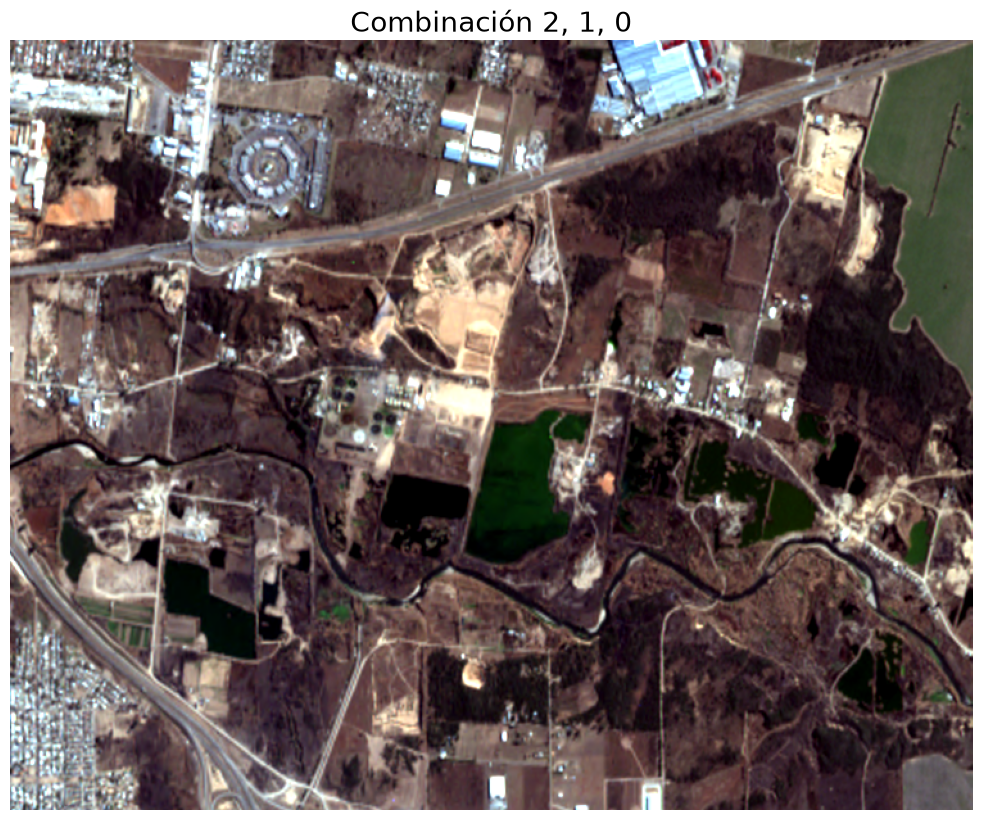

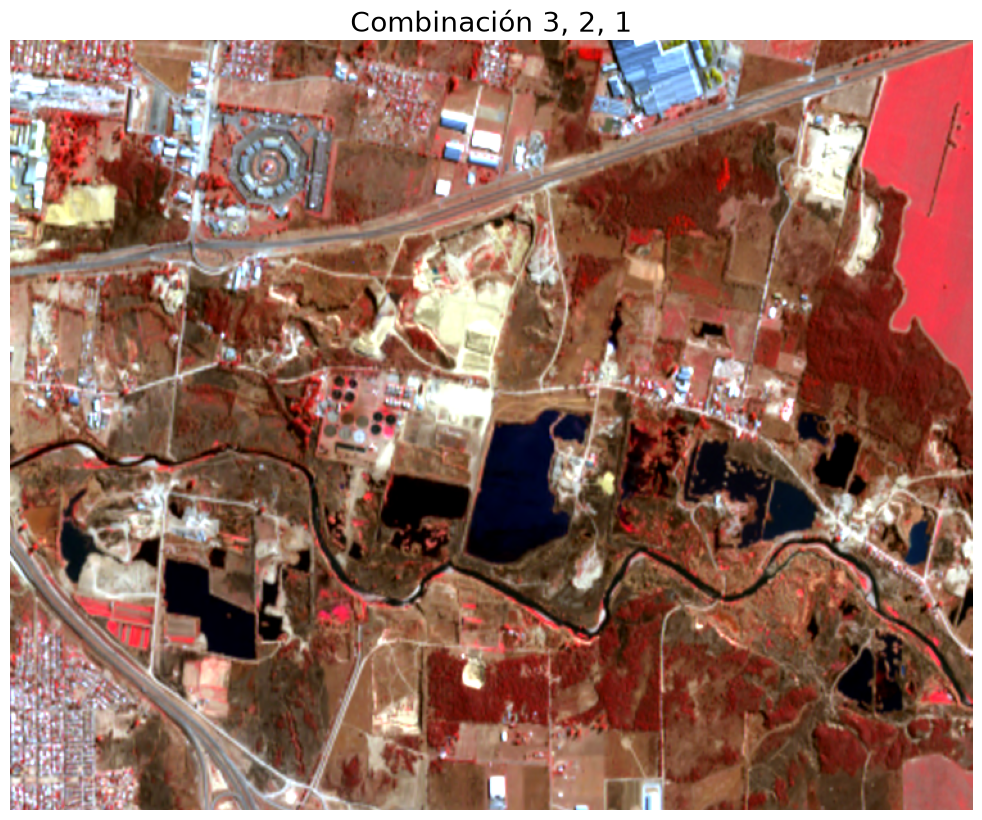

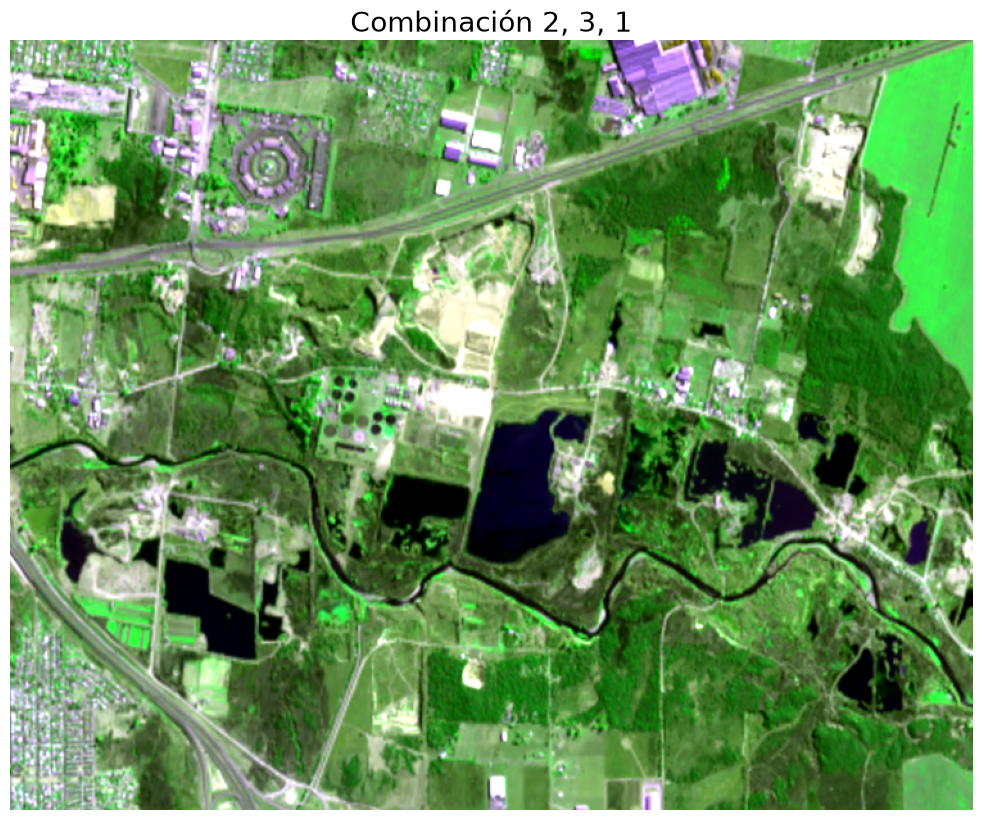

In [11]:
# Probar la combinación 2,1,0
r = 2
g = 1
b = 0

fig, ax = plt.subplots(figsize=(20,10))
ax.set_title(f'Combinación {r}, {g}, {b}', size=20)
ax.imshow(imagen_escalada[[r, g, b]].transpose(1,2,0))
ax.axis("off")
plt.show()

# Probar la combinación 3,2,1
r = 3
g = 2
b = 1

fig, ax = plt.subplots(figsize=(20,10))
ax.set_title(f'Combinación {r}, {g}, {b}', size=20)
ax.imshow(imagen_escalada[[r, g, b]].transpose(1,2,0))
ax.axis("off")
plt.show()

# Probar la combinación 2,3,1
r = 2
g = 3
b = 1

fig, ax = plt.subplots(figsize=(20,10))
ax.set_title(f'Combinación {r}, {g}, {b}', size=20)
ax.imshow(imagen_escalada[[r, g, b]].transpose(1,2,0))
ax.axis("off")
plt.show()

In [ ]:
def scale_multiband(imagen, p = 0, nodata = None):  
    # Crear un array vacio con la misma estructura que imagen_spot_apilada, pero con tipo de dato uint8 (en caso de usar la función scale que escala a 0-255).
    imagen_escalada = np.empty_like(imagen, dtype=np.uint8)

    # Definir una variable con el número de canales
    canales = imagen_escalada.shape[0]

    # Escalar una a una las bandas (usando p)
    for i in range(canales):
      canal = imagen[i, :, :]
      imagen_escalada[i, :, :] = scale(canal, p)
      
    return imagen_escalada


'''# Crear un array vacio con la misma estructura que imagen_spot_apilada, pero con tipo de dato uint8 (en caso de usar la función scale que escala a 0-255).
imagen_escalada = np.empty_like(spot_apilada, dtype=np.uint8)

# Definir una variable con el número de canales
canales = imagen_escalada.shape[0]

# Escalar una a una las bandas (usando p=1)
for i in range(canales):
  canal = spot_apilada[i, :, :]
  imagen_escalada[i, :, :] = fn.scale(canal, p = 2)

print(f'Dimensiones de la imagen escalada: {imagen_escalada.shape}')'''

In [6]:
spot_test = fn.scale_multiband(spot_apilada, 5)

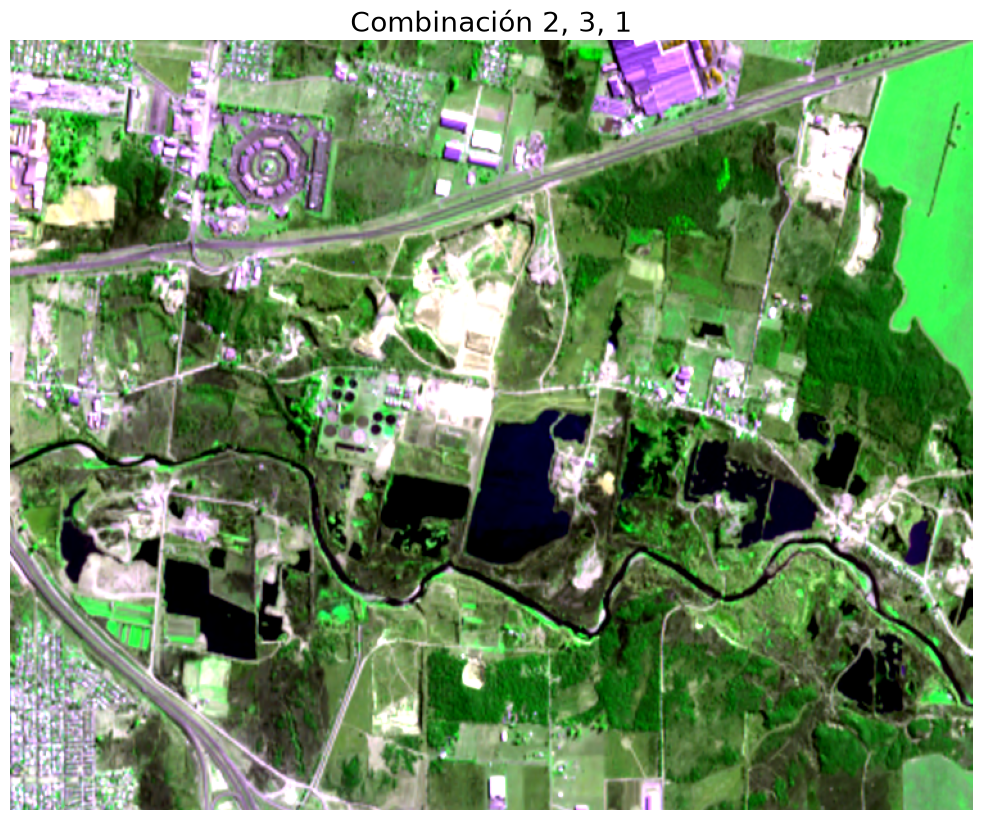

In [8]:
# Probar la combinación 2,3,1
r = 2
g = 3
b = 1

fig, ax = plt.subplots(figsize=(20,10))
ax.set_title(f'Combinación {r}, {g}, {b}', size=20)
ax.imshow(spot_test[[r, g, b]].transpose(1,2,0))
ax.axis("off")
plt.show()

### Ejercicio 1.2:

a) Usando como base la función **scale()** de la Clase 02, programá una función **scale_multiband** tome como entrada un _array_ multibanda, y el valor de percentil _p_ al cual estirar cada una de las bandas (valor por defecto `p = 0` , y de `nodata = None`), y que devuelva un **stack** scalado. Para hacer el estiramiento en sí, esta función debe llamar a _scale()_. También vas a tener que agregar un parámetro adicional que se refiera a cuál es el valor de píxel que debe ser considerado como nodata. Sería algo así:


```python 
def scale_multiband(imagen, p = 0, nodata = None):  
    ...  
    # Definir una variable con el número de canales
    canales = ...

    for i in range(canales):
      canal = ...
      imagen_escalada[i, :, :] = scale(...)
    ...    
    return imagen_escalada
```
    
      
Guardar la función en tu archivo funciones.py. A continuación, probala sobre el archivo `MOD09A1.A2000049.h11v08.006.2015136143404.hdf` de la Clase 02, aplicándola sobre un apilado de las bandas 01,02 y 03.

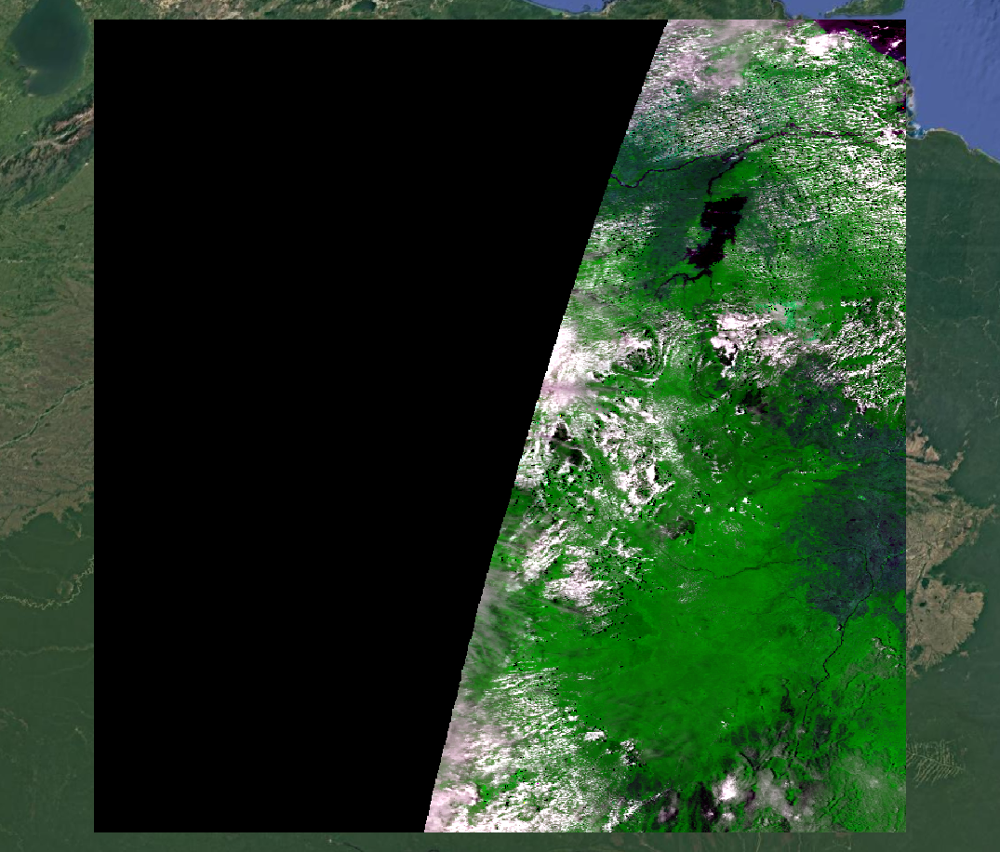

**IMPORTANTE:** Cada vez que actualizás tu archivo de funciones (ya sea para agregar una nueva o modificar una existente), es probable que tengas que actualizar el _kernel_ de tu sesón. Eso lo hacés desde el siguiente menú, y podés al mismo tiempo volver a correr todas las celdas para volver a definir las variables con las que venias trabajando.

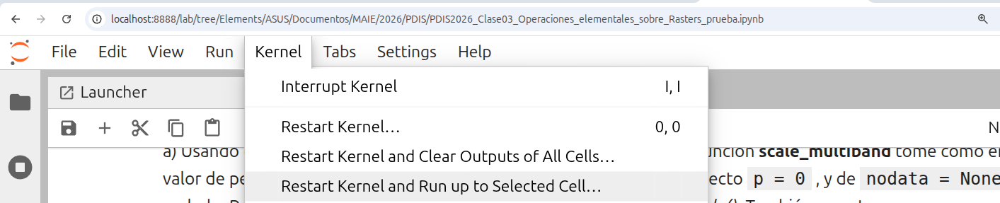

Código para leer y apilas las 3 bandas:

```python
b01 = (
    'HDF4_EOS:EOS_GRID:"data/MOD09A1.A2000049.h11v08.006.2015136143404.hdf":'
    'MOD_Grid_500m_Surface_Reflectance:sur_refl_b01'
)

b02 = (
    'HDF4_EOS:EOS_GRID:"data/MOD09A1.A2000049.h11v08.006.2015136143404.hdf":'
    'MOD_Grid_500m_Surface_Reflectance:sur_refl_b02'
)

b03 = (
    'HDF4_EOS:EOS_GRID:"data/MOD09A1.A2000049.h11v08.006.2015136143404.hdf":'
    'MOD_Grid_500m_Surface_Reflectance:sur_refl_b03'
)

b01_rasterio = rasterio.open(b01)
b01_array = b01_rasterio.read()[0]

b02_rasterio = rasterio.open(b02)
b02_array = b02_rasterio.read()[0]

b03_rasterio = rasterio.open(b03)
b03_array = b03_rasterio.read()[0]

apilado_modis = np.array((b01_array,b02_array,b03_array))
```

In [12]:
b01 = (
    'HDF4_EOS:EOS_GRID:"https://github.com/francobarrionuevoenv21/MAIE_devs_pub/raw/refs/heads/main/Proc_Img/practicos/data/MOD09A1.A2000049.h11v08.006.2015136143404.hdf":'
    'MOD_Grid_500m_Surface_Reflectance:sur_refl_b01'
)

b02 = (
    'HDF4_EOS:EOS_GRID:"https://github.com/francobarrionuevoenv21/MAIE_devs_pub/raw/refs/heads/main/Proc_Img/practicos/data/MOD09A1.A2000049.h11v08.006.2015136143404.hdf":'
    'MOD_Grid_500m_Surface_Reflectance:sur_refl_b02'
)

b03 = (
    'HDF4_EOS:EOS_GRID:"https://github.com/francobarrionuevoenv21/MAIE_devs_pub/raw/refs/heads/main/Proc_Img/practicos/data/MOD09A1.A2000049.h11v08.006.2015136143404.hdf":'
    'MOD_Grid_500m_Surface_Reflectance:sur_refl_b03'
)

b01_rasterio = rasterio.open(b01)
b01_array = b01_rasterio.read()[0]

b02_rasterio = rasterio.open(b02)
b02_array = b02_rasterio.read()[0]

b03_rasterio = rasterio.open(b03)
b03_array = b03_rasterio.read()[0]

apilado_modis = np.array((b01_array,b02_array,b03_array))

RasterioIOError: HDF4_EOS:EOS_GRID:"https://github.com/francobarrionuevoenv21/MAIE_devs_pub/raw/refs/heads/main/Proc_Img/practicos/data/MOD09A1.A2000049.h11v08.006.2015136143404.hdf":MOD_Grid_500m_Surface_Reflectance:sur_refl_b01: No such file or directory

## 2) Operaciones básicas: Cálculo de índices y escritura de nuestras imágenes

Ahora que hemos leido nuestra imagen y hemos logrado extraer un recorte y visualizarla, realizaremos algunas operaciones básicas entre sus bandas.

1) En primer lugar, obtendremos algunos índices espectrales operando entre las bandas. 
2) Luego, veremos como guardar los resultados a un nuevo archivo.

### 2.1. Álgebra de bandas

A continuación vamos a hacer algunas operaciones con las bandas del recorte realizado (nuestra variable `spot_apilada`) para obtener nuevos productos. Al ser arreglos de `Numpy`, se pueden realizar operaciones matemáticas con la mismas y entre ellas también (sumarlas, multiplacarlas, restarlas, dividirlas, normalizarlas por una constante, etc). 

Aprovecharemos estas capacidades para calcular dos índices normalizados que son de gran uso en la Teledetección Óptica: El Índice de Vegetación Normalizado (o _NDVI_ por sus siglas en inglés), y el Índice de Agua Normalizado (o _NDWI_ por sus siglas en inglés), que trabajarán ustedes en un ejercicio:

$ NDVI = \frac{NIR - R}{NIR + R} $  

Donde $NIR$ se refiere a la banda del Infrarrojo Cercano, y $R$ se refiere a la banda del Rojo (¿Cuáles serían en nuestra SPOT?).

```python
#Cálculo  y visualización del NDVI

# Tip: Recordar que se pueden consultar distintas paletas de color de matplotlib aquí: https://matplotlib.org/stable/tutorials/colors/colormaps.html

#Cálculo  y visualización del NDVI

# Tip: Recordar que se pueden consultar distintas paletas de color de matplotlib aquí: https://matplotlib.org/stable/tutorials/colors/colormaps.html

b_nir = spot_apilada[3].astype(np.float32)
b_red = spot_apilada[2].astype(np.float32)

ndvi = (b_nir - b_red) / (b_nir + b_red)

fig,ax = plt.subplots(figsize = (12,6))
ax.imshow(ndvi, vmin = 0, vmax = 0.75, cmap = 'gray')
ax.set_title("NDVI")
fig.colorbar(ax.images[0], ax=ax)
plt.show()
```

Probemos con otra paleta de color, aplicándole la función scale() al NDVI:

```python
fig,ax = plt.subplots(figsize = (12,6))
ax.imshow(ndvi, vmin = 0, vmax = 0.75, cmap = 'Greens')
ax.set_title("NDVI")
fig.colorbar(ax.images[0], ax=ax)
plt.show()
```

### Ejercicio 2.1:

Repetir los pasos realizados con el NDVI, para calcular el Ìndice Normalizado de Agua (o NDWI) según la siguiente fórmula:

$ NDWI = \frac{G - NIR}{G + NIR} $ 

Donde $ G $ corresponde a la banda del verde, y $NIR$ es la misma que utilizamos para el NDVI

**Nota**: La fórmula propuesta para el NDWI corresponde a la formulación de [Mc. Feeters (1996)](https://hess.copernicus.org/articles/22/4349/2018/hess-22-4349-2018-t01.pdf)

### 2.2. Escritura de archivos recortados

Ahora que tenemos recortados nuestros archivos y que hemos generado algunos productos nuevos, veamos como guardarlos en nuestro equipo. 

Hay algunas cuestiones a considerar, como ser:

- La proyección de nuestro archivo
- En qué formato vamos a querer guardar nuestro raster, es decir qué _driver_ usaremos.
- El tipo de dato del archivo que queremos guardar (principalmente si será un raster con números enteros o flotantes).
- Las **dimensiones** del archivo que queremos guardar: Recordar que ahora estamos almacenando un recorte de nuestra imagen orginal.
- La geotransformación o _transform_ , que hemos leido al principio de la notebook en la variable `transform_spot_original` ,pero que ahora deberemos adaptar a nuestro recorte.

Cuando vamos a generar un archivo con Rasterio, lo más práctico es definir los metadatos de la imagen de salida en una única variable. Toda imagen leída con Rasterio tiene unos metadatos asociados, donde se encuentran especificadas todas las propuedades necesarias para leer el archivo. Veamos por ejemplo cómo son los metadatos de la imagen original, `spot_multibanda`:

```python
spot_multibanda.meta
```

En este último parámetro (metadatos) se resume toda la información del Raster, con estructura de diccionario. Cuando escribamos imágenes modificadas vamos a editar principalmente este atributo.

**¿Qué es un diccionario?**  Los diccionarios son estructuras de datos que, al igual que las listas y las tuplas, permiten almacenar diferentes tipos de datos, sin embargo, a diferencia de estas los elementos no son indexados, sino que se almacenan de la forma llave y valor, donde la llave corresponde a un identificador único que permite acceder al elemento. Un diccionario se define entre llaves {}, cada uno de sus elementos se encuentra separado por comas (,) y cada par {llave: valor} se separa por dos puntos (:)

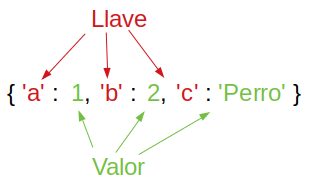

Entonces, lo que haremos es actualizar o modificar las propiedades de este diccionario que deben cambiar, y luego crear uno nuevo. Empecemos por revisar el `transform`, para lo cual retomaremos algunas cosas de la Clase 02

```python
print(transform_spot_original)
```

Nuestro recorte comparte casi todos los atributos del parámetro _Trasnform_con la imagen original, excepto el 1) y el 4). Efectivamente, la esquina superior izquierda de nuestro recorte no es el mismo, y de alguna manera tenemos que poder recalcularlas.

Nosotros hicimos el recorte de la SPOT con el siguiente código:

```
ulx, uly = 393360.0, 6526862.0
lrx, lry = 397860.0, 6523262.0


spot_apilada, ventana_recorte = fn.subset_img(spot_multibanda, ulx, uly, lrx, lry)
```

Es decir que la esquina superior izquierda estaría ubicada en la fila 199, columna 749:

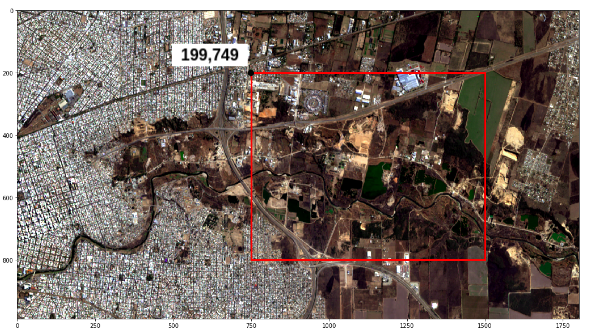

Además, tenemos la ventana de recorte capturada en `ventana_recorte`. Con esa información podemos re-calcular nuestro `transform` y que tome la esqina superior izquierda nueva. Esto lo hacemos con `rasterio.windows.transform`:

```python
transform_recorte = rasterio.windows.transform(ventana_recorte, transform_spot_original)
print(transform_recorte)
```

Otra variable que cambia respecto a la imagen original son sus dimensiones (filas y columnas). Esto lo podemos obtener con el método _.shape()_ y asignarlo a variables:

```python
print('Dimensiones del recorte:', spot_apilada.shape)

filas = spot_apilada.shape[1]
columnas = spot_apilada.shape[2]

print('Filas, Columnas:', filas, columnas)
```

El resto de las propiedades (Sistema de Coordenadas, tipo de dato,y formato o `driver`) no van a cambiar respecto a la imagen original. Vamos a definir entonces una nueva variable llamada `recorte_medatatos`, que consistirá en el diccionario de metadatos para guardar nuestra imagen `spot_apilada`:

```python
from rasterio.crs import CRS

recorte_metadatos = {'driver': 'GTiff',
                  'dtype': 'float32',
                  'nodata': None,
                  'width': columnas,
                  'height': filas,
                  'count': spot_apilada.shape[0], #Leemos la cantidad de bandas
                  'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 20S",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-63],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",10000000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32720"]]'),
 'transform': transform_recorte}
 ```

Con estos nuevos metadatos definidos, usamos el siguiente comando para generar nuestro archivo y pasarle la información de `spot_apilada` y `recorte_metadatos`:


```python
# Asegurate de crear antes una carpeta 'output'

# recorte_metadatos es un diccionario con la información del nuevo raster.
# El operador ** "desempaqueta" ese diccionario y pasa cada clave como un
# argumento independiente a rasterio.open().

# Es equivalente a escribir:
# rasterio.open(
#     'output/Clase03_spot_apilada_rec.tif',
#     'w',
#     driver=recorte_metadatos["driver"],
#     width=recorte_metadatos["width"],
#     height=recorte_metadatos["height"],
#     count=recorte_metadatos["count"],
#     dtype=recorte_metadatos["dtype"],
#     crs=recorte_metadatos["crs"],
#     transform=recorte_metadatos["transform"],
#     ...
# )

dst = rasterio.open('output/Clase03_spot_apilada_rec.tif', 'w', **recorte_metadatos)
dst.write(s2_clip)
del dst
```

Una forma más elegante de hacer esta operación es utilizar un bloque de código contenido en un `with`: 

```python
with rasterio.open('output/Clase03_spot_apilada_rec.tif', 'w', **recorte_metadatos) as dst:
    dst.write(spot_apilada)
```

El uso de `with` permite gestionar automáticamente la apertura y el cierre del archivo. Al finalizar el bloque de código, Python cierra el archivo y libera los recursos asociados. De esta forma se evita tener que llamar explícitamente al método `del` (o eliminar la referencia al objeto) y se reduce el riesgo de dejar archivos abiertos.

Algo muy útil cuando guardamos nuestros archivos es ponerle descripciones a las bandas. De esa manera, quien reciba el archivo puede ser a qué región del espectro correspnde cada una de ellas. Esto lo podemos hacer con el método `set_band_description`. 

```python
# Defino una lista con las descripciones de las bandas
bandas = ["Azul", "Verde", "Rojo", "NIR"]

with rasterio.open("output/Clase03_spot_apilada_rec_con_desc.tif", "w", **recorte_metadatos) as dst:
    dst.write(spot_apilada)

    # Recorro la lista y voy poniéndole la descripción a cada banda
    for i, nombre in enumerate(bandas):
        dst.set_band_description(i+1, nombre)
```

In [9]:
# Defino una lista con las descripciones de las bandas
bandas = ["Azul", "Verde", "Rojo", "NIR"]

with rasterio.open("output/Clase03_spot_apilada_rec_con_desc.tif", "w", **recorte_metadatos) as dst:
    dst.write(spot_apilada)

    # Recorro la lista y voy poniéndole la descripción a cada banda
    for i, nombre in enumerate(bandas):
        dst.set_band_description(i+1, nombre)

NameError: name 'recorte_metadatos' is not defined

#### Yapa: ¿Y si quisiéramos guardar una sola banda?

Esta última sección te va a servir para resolver el ejercicio que queda. Supongamos que quisiéramos guardar solamente la banda 4 (el NIR), que corresponde a `spot_apilada[3]`. En ese caso, deberíamos definir unos metadatos adaptados a esa cantidad de canales:

```python
recorte_metadatos_una_banda = {'driver': 'GTiff',
                  'dtype': 'float32',
                  'nodata': None,
                  'width': columnas,
                  'height': filas,
                  'count': 1, #Solo guardamos una banda
                  'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 20S",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-63],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",10000000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32720"]]'),
 'transform': transform_recorte}
```

Luego, la instrucción para guardar el raster es casi igual, solo que hay que especificar que solo se quiere escribir sobre la banda 1:

```python
with rasterio.open(
    "output/Clase03_spot_apilada_rec_banda_NIR.tif", "w",**recorte_metadatos_una_banda) as dst:
    dst.write(spot_apilada[3], 1)   # escribir en la banda 1
    dst.set_band_description(1, "NIR")
```

### Ejercicio 2.2

Repetir los pasos para la escritura del recorte, con los índices NDVI y NDWI calculados en la sección anterior.
Probar dos alternativas:

a) Guardar cada uno de los índices como archivos separados. Nombralos como **output/spot_apilada_rec_ndvi.tif** y **output/spot_apilada_rec_ndwi.tif** respectivamente.

b) Generar un raster que contenga las 4 bandas multiespectrales, el NDVI y el NDWI (en ese orden), y guardarlo como **output/spot_apilada_rec_indices.tif**. Previamente, vas a tener que apilar todas las bandas en un único _stack_ (fijate que más arriba usamos `np.array` para eso con los canales `r,g,b`).

Para ambos casos, agregar las descripciones de las bandas correspondientes.

<h3 style="color:red;">Ejercicio 2.3. - Entregable!</h3>

Elegí un umbral para binarizar la imagen de NDWI calculada en el ejercicio 2.1 (podés repetir el que usaste para la Clase 02) y diferenciar Agua de No-Agua, aplicando la misma lógica que usamos sobre la imagen de Homero en la Clase 01. Guardá esa máscara como un archivo GeoTiff en `output`, reutilizando los metadatos de la imagen original como ayuda.

<h3 style="color:red;">Ejercicio 2.4. - Entregable!</h3>

Buscá una escena satelital óptica distinta a las que trabajamos en esta Notebook que contenga las bandas necesarias para calcular un índice espectral de tu interés. Puede ser un archivo GeoTiff ya procesado previamente por vos en otro curso, no tiene que ser una imagen satelital cruda. También podés abrir las bandas por separado, si vienen así. Definí un par de coordenadas de interés para extraer un recorte, calculá el índice correspondiente sobre ese recorte, y guardá el archivo como GeoTiff. También podés guardar las bandas que utilizaste para computarlo. Incluí las descripciones de bandas correspondientes y asegúrate de que la geolocalización de la imagen de salida sea correcta.

Por último, incluí visualizaciones en RGB combinando las distintas bandas disponibles, aprovechando la función `scale_multiband` que desarrollamos en el ejercicio 1.2. Si las bandas vienen como archivos separados, utilizá `np.array()`u otra similar, para apilarlas.